In [109]:
try:
    import scipy.io as sio
except ImportError:
   
    import scipy.io as sio

import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable

%matplotlib inline


In [110]:
# โหลดไฟล์ .mat
file_path = 'IMG_0191.mat'   
varname = 'pl'             

mat = sio.loadmat(file_path)
if varname not in mat:
    raise KeyError(f"ตัวแปร '{varname}' ไม่มีในไฟล์ {file_path}")

vol = mat[varname]
print('volume shape =', vol.shape)

if vol.ndim != 3:
    raise ValueError(f'คาดว่าเป็น 3D volume (ny, nx, nz) แต่ได้ shape = {vol.shape}')

ny, nx, nz = vol.shape
print(f'ny = {ny}, nx = {nx}, nz = {nz} (จำนวนสไลด์)')

volume shape = (201, 201, 61)
ny = 201, nx = 201, nz = 61 (จำนวนสไลด์)


In [111]:

fft_vol = np.fft.fft2(vol, axes=(0, 1))       
fft_vol = np.fft.fftshift(fft_vol, axes=(0, 1))  

print('fft_vol shape =', fft_vol.shape)

fft_vol shape = (201, 201, 61)


In [112]:
# เพิ่มพารามิเตอร์ cmap_img (สีภาพซ้าย) และ cmap_fft (สีภาพขวา)
def show_slice_fft(k, vmin=None, vmax=None, cmap_img='gist_heat', cmap_fft='turbo'):
    
    if not (0 <= k < nz):
        raise ValueError(f'k ต้องอยู่ระหว่าง 0 ถึง {nz-1}')

    img = vol[:, :, k]
    F = fft_vol[:, :, k]
    log_mag = np.log1p(np.abs(F))

    fig, axes = plt.subplots(1, 2, figsize=(12, 5))

    # --- ส่วนปรับความสว่าง (ใช้ code ล่าสุดของคุณ) ---
    if vmin is None: vmin = np.percentile(img, 2)
    if vmax is None: vmax = np.percentile(img, 95) 

    # 1. ภาพซ้าย: ใช้ตัวแปร cmap_img
    im0 = axes[0].imshow(img, cmap=cmap_img, origin='lower', vmin=vmin, vmax=vmax)
    axes[0].set_title(f'Original (k={k}) ')
    axes[0].axis('off')
    plt.colorbar(im0, ax=axes[0], fraction=0.046, pad=0.04)

    # 2. ภาพขวา: ใช้ตัวแปร cmap_fft
    im1 = axes[1].imshow(log_mag, cmap=cmap_fft, origin='lower')
    axes[1].set_title(f'FFT (k={k}) ')
    axes[1].axis('off')
    plt.colorbar(im1, ax=axes[1], fraction=0.046, pad=0.04)

    plt.tight_layout()
    plt.show()

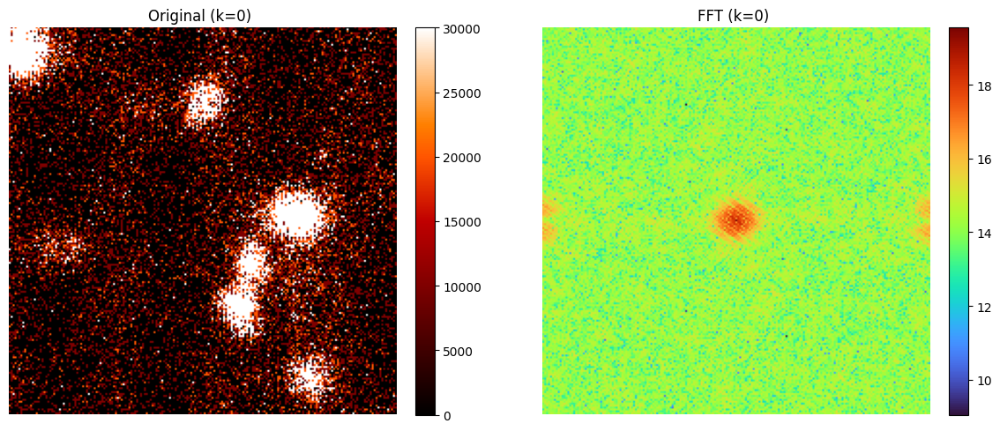

In [113]:
k = 0 
show_slice_fft(k)

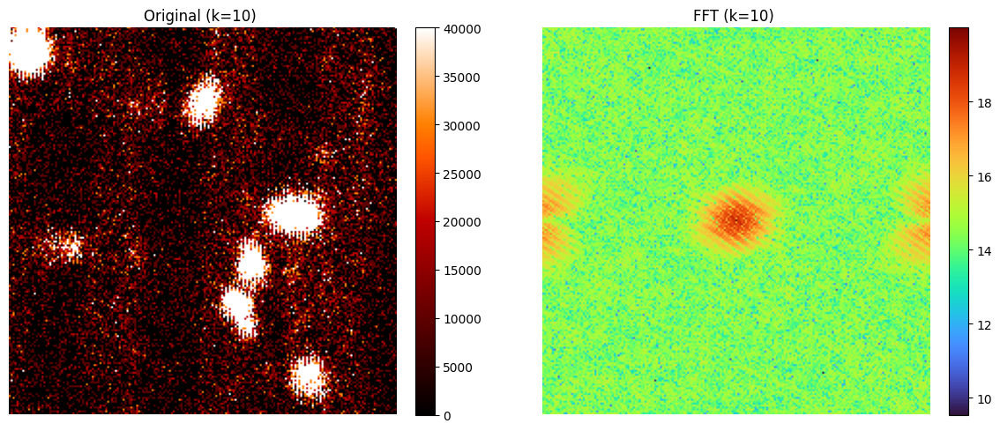

In [114]:
k = 10 
show_slice_fft(k)

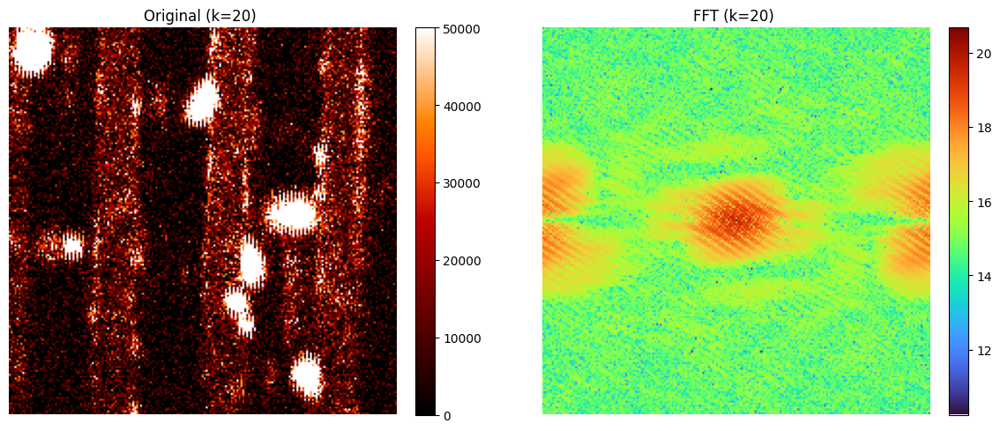

In [115]:
k = 20 
show_slice_fft(k)

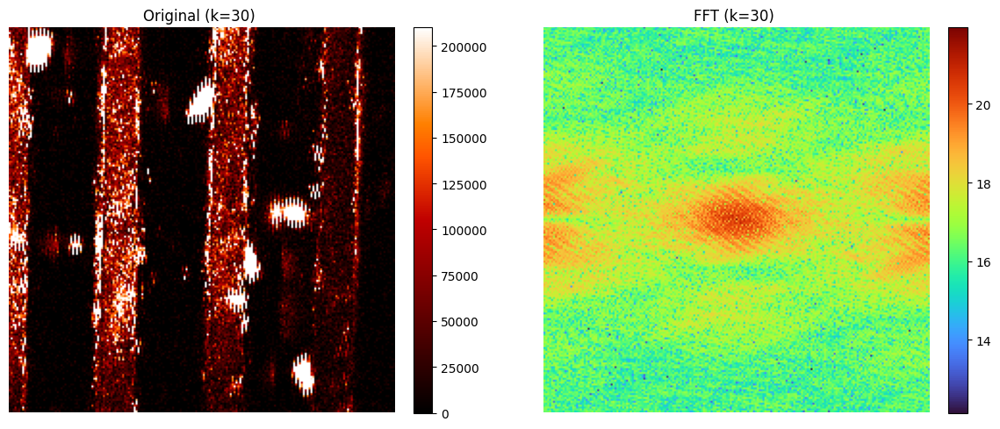

In [116]:
k = 30 
show_slice_fft(k)

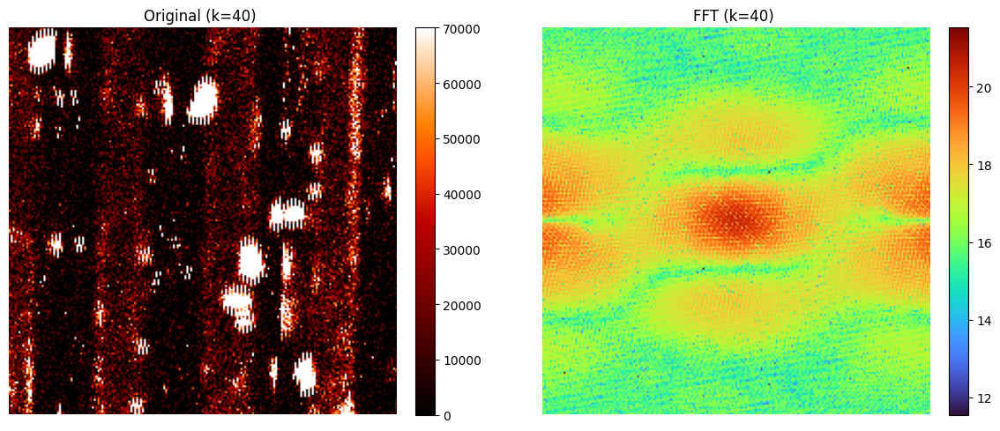

In [117]:
k = 40 
show_slice_fft(k)

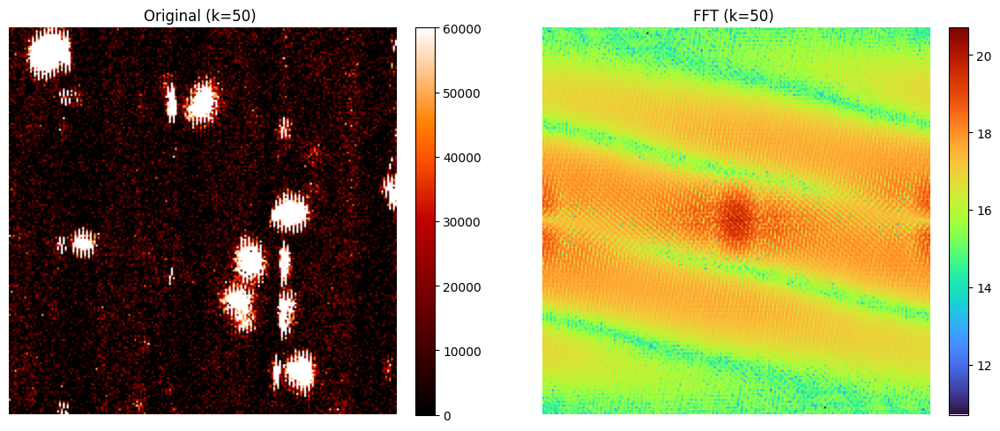

In [118]:
k = 50 
show_slice_fft(k)

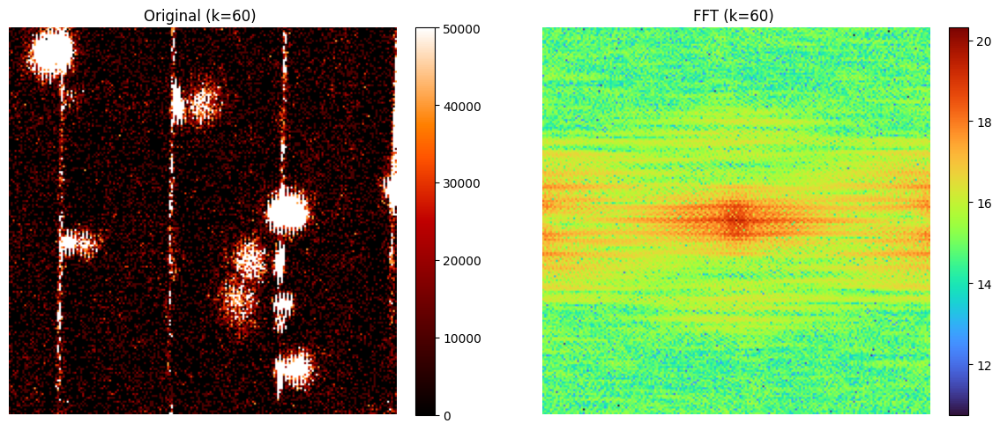

In [119]:
k = 60 
show_slice_fft(k)

Gaussian Lowpass Filter (แบบระฆังคว่ำ)

In [120]:
# 1. สร้างฟังก์ชันสำหรับทำหน้ากาก Gaussian Lowpass Filter
def create_gaussian_mask(shape, D0):
    """
    สร้าง Gaussian Lowpass Filter
    shape: ขนาดภาพ (rows, cols)
    D0: รัศมี (Cutoff Frequency) ยิ่งค่าน้อย ภาพยิ่งเบลอมาก (กรองความถี่สูงออกเยอะ)
    """
    rows, cols = shape
    crow, ccol = rows // 2, cols // 2
    
    # สร้าง Grid เพื่อคำนวณระยะห่างจากจุดศูนย์กลาง
    u = np.arange(rows)
    v = np.arange(cols)
    U, V = np.meshgrid(v, u)
    D = np.sqrt((U - ccol)**2 + (V - crow)**2)
    
    # สูตร Gaussian: H(u,v) = e^(-D^2 / 2*D0^2)
    # ค่าจะค่อยๆ ลดจาก 1 ตรงกลาง ไปหา 0 ที่ขอบ แบบระฆังคว่ำ
    mask = np.exp(-(D**2) / (2 * (D0**2)))
    
    return mask

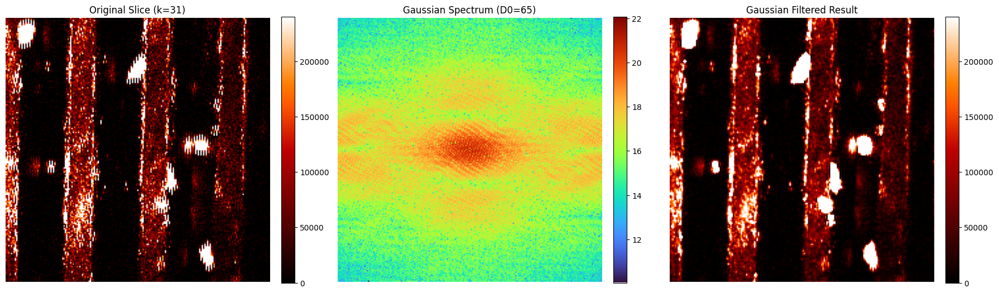

In [121]:
# 2. ฟังก์ชันสำหรับประมวลผลและแสดงภาพ
def show_gaussian_filter(k, D0=30):
    """
    k: index ของสไลด์ที่ต้องการดู
    D0: ค่าความเบลอ (ค่ามาตรฐานแนะนำประมาณ 30-50)
    """
    if not (0 <= k < nz):
        raise ValueError(f'k ต้องอยู่ระหว่าง 0 ถึง {nz-1}')

    # ดึงข้อมูล FFT ของสไลด์นั้นมา (จากตัวแปร global fft_vol)
    F = fft_vol[:, :, k]
    
    # สร้าง Gaussian Mask
    mask = create_gaussian_mask(F.shape, D0)
    
    # คูณ FFT กับ Mask (การกรองในโดเมนความถี่)
    F_filtered = F * mask
    
    # แปลงกลับเป็นภาพด้วย Inverse FFT
    img_back = np.fft.ifft2(np.fft.ifftshift(F_filtered)).real
    
    # ดึงภาพต้นฉบับมาเทียบ
    img_orig = vol[:, :, k]

    # --- ส่วนแสดงผล ---
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))
    
    # คำนวณ vmin/vmax แบบ Percentile เพื่อให้ภาพสว่างชัดเจน (ตามที่คุณชอบ)
    vmin = np.percentile(img_orig, 2)
    vmax = np.percentile(img_orig, 95) 

    # ภาพที่ 1: ต้นฉบับ
    im0 = axes[0].imshow(img_orig, cmap='gist_heat', origin='lower', vmin=vmin, vmax=vmax)
    axes[0].set_title(f'Original Slice (k={k})')
    axes[0].axis('off')
    plt.colorbar(im0, ax=axes[0], fraction=0.046, pad=0.04)

    # ภาพที่ 2: หน้ากาก Gaussian (Spectrum)
    # แสดง log magnitude เพื่อให้เห็นการกระจายตัวของพลังงาน
    log_mag_filt = np.log1p(np.abs(F_filtered))
    im1 = axes[1].imshow(log_mag_filt, cmap='turbo', origin='lower')
    axes[1].set_title(f'Gaussian Spectrum (D0={D0})')
    axes[1].axis('off')
    plt.colorbar(im1, ax=axes[1], fraction=0.046, pad=0.04)

    # ภาพที่ 3: ผลลัพธ์หลังกรอง (Filtered Image)
    im2 = axes[2].imshow(img_back, cmap='gist_heat', origin='lower', vmin=vmin, vmax=vmax)
    axes[2].set_title(f'Gaussian Filtered Result')
    axes[2].axis('off')
    plt.colorbar(im2, ax=axes[2], fraction=0.046, pad=0.04)

    plt.tight_layout()
    plt.show()

# ลองปรับค่า D0 ดูครับ: 
# D0 น้อย (เช่น 10) -> ภาพเบลอมาก, Noise หายหมด
# D0 มาก (เช่น 60) -> ภาพคมชัดขึ้น, แต่ Noise อาจจะกลับมา
show_gaussian_filter(k=31, D0=65)

Ideal Lowpass Filter (แบบวงกลมแข็ง)

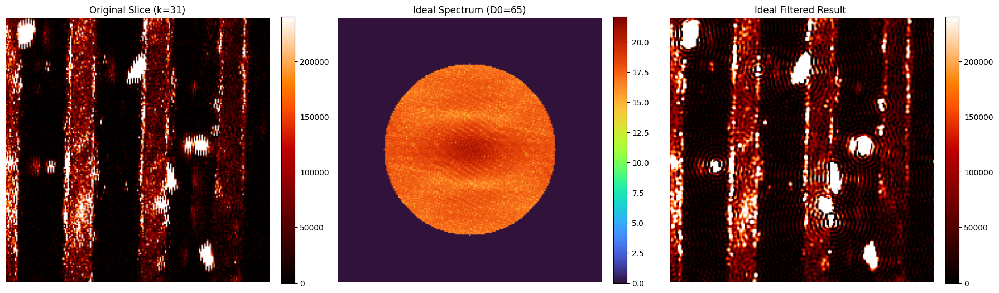

In [122]:
# 1. สร้างฟังก์ชันทำหน้ากาก Ideal (วงกลมขาว-ดำ)
def create_ideal_mask(shape, D0):
    """
    สร้าง Ideal Lowpass Filter (วงกลม)
    shape: ขนาดภาพ (rows, cols)
    D0: รัศมีวงกลม (Cutoff Frequency)
    """
    rows, cols = shape
    crow, ccol = rows // 2, cols // 2
    
    # สร้าง Grid ระยะห่าง
    u = np.arange(rows)
    v = np.arange(cols)
    U, V = np.meshgrid(v, u)
    D = np.sqrt((U - ccol)**2 + (V - crow)**2)
    
    # สูตร Ideal: ถ้า D <= D0 ให้เป็น 1, ถ้าเกินให้เป็น 0
    mask = np.where(D <= D0, 1, 0)
    
    return mask

# 2. ฟังก์ชันแสดงผล Ideal Filter
def show_ideal_filter(k, D0=30):
    if not (0 <= k < nz):
        raise ValueError(f'k ต้องอยู่ระหว่าง 0 ถึง {nz-1}')

    F = fft_vol[:, :, k]
    
    # สร้าง Ideal Mask
    mask = create_ideal_mask(F.shape, D0)
    
    # คูณ FFT กับ Mask
    F_filtered = F * mask
    
    # แปลงกลับเป็นภาพ
    img_back = np.fft.ifft2(np.fft.ifftshift(F_filtered)).real
    img_orig = vol[:, :, k]

    # --- ส่วนแสดงผล ---
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))
    
    vmin = np.percentile(img_orig, 2)
    vmax = np.percentile(img_orig, 95)

    # 1. Original
    im0 = axes[0].imshow(img_orig, cmap='gist_heat', origin='lower', vmin=vmin, vmax=vmax)
    axes[0].set_title(f'Original Slice (k={k})')
    axes[0].axis('off')
    plt.colorbar(im0, ax=axes[0], fraction=0.046, pad=0.04)

    # 2. Spectrum (จะเห็นเป็นวงกลมชัดเจน)
    log_mag_filt = np.log1p(np.abs(F_filtered))
    # ใช้ vmin=0 เพื่อให้เห็นขอบดำตัดชัดๆ
    im1 = axes[1].imshow(log_mag_filt, cmap='turbo', origin='lower') 
    axes[1].set_title(f'Ideal Spectrum (D0={D0})')
    axes[1].axis('off')
    plt.colorbar(im1, ax=axes[1], fraction=0.046, pad=0.04)

    # 3. Result (สังเกตเงาคลื่นรอบวัตถุ!)
    im2 = axes[2].imshow(img_back, cmap='gist_heat', origin='lower', vmin=vmin, vmax=vmax)
    axes[2].set_title(f'Ideal Filtered Result ')
    axes[2].axis('off')
    plt.colorbar(im2, ax=axes[2], fraction=0.046, pad=0.04)

    plt.tight_layout()
    plt.show()


show_ideal_filter(k=31, D0=65)

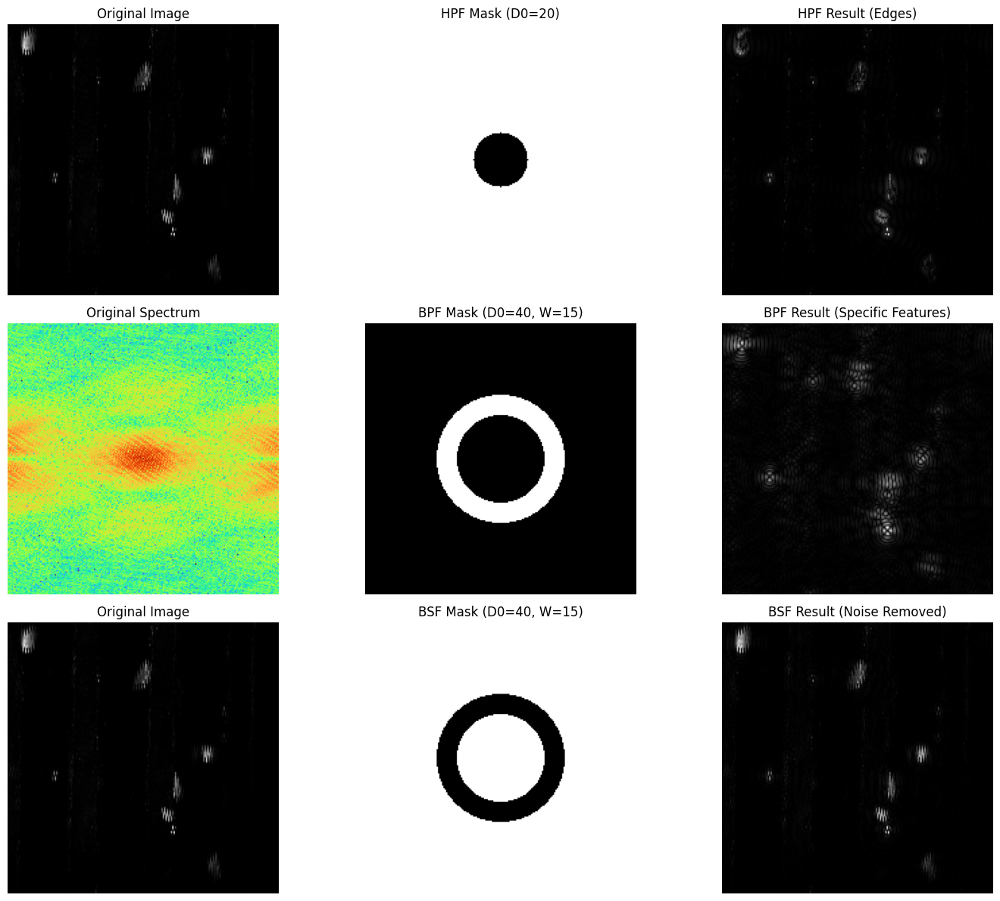

In [123]:
# ฟังก์ชันสร้าง Mask สำหรับ Ideal Filters แบบต่างๆ
def create_ideal_mask(shape, filter_type, d0, w=None):
    rows, cols = shape
    crow, ccol = rows // 2, cols // 2
    
    # สร้าง Grid ระยะห่างจากจุดกึ่งกลาง (Distance Matrix)
    y, x = np.ogrid[:rows, :cols]
    dist = np.sqrt((x - ccol)**2 + (y - crow)**2)
    
    if filter_type == 'HPF':
        # High Pass Filter: บล็อกความถี่ต่ำตรงกลาง (0) ปล่อยความถี่สูงผ่าน (1)
        mask = np.ones((rows, cols))
        mask[dist <= d0] = 0
        
    elif filter_type == 'BPF':
        # Band Pass Filter: ปล่อยความถี่ในช่วง Band ผ่าน (1) ที่เหลือบล็อก (0)
        # ช่วงความถี่: d0 - w/2 ถึง d0 + w/2
        if w is None: w = 10
        mask = np.zeros((rows, cols))
        mask[(dist >= d0 - w/2) & (dist <= d0 + w/2)] = 1
        
    elif filter_type == 'BSF':
        # Band Stop Filter: บล็อกความถี่ในช่วง Band (0) ที่เหลือปล่อยผ่าน (1)
        if w is None: w = 10
        mask = np.ones((rows, cols))
        mask[(dist >= d0 - w/2) & (dist <= d0 + w/2)] = 0
        
    else:
        raise ValueError(f"Unknown filter type: {filter_type}")
        
    return mask

# --- การใช้งานและแสดงผล ---

# 1. ตั้งค่าพารามิเตอร์
k = 30             # เลือก Slice ที่ต้องการทดสอบ (ควรเลือก Slice ที่มีรายละเอียดชัดเจน)
D0_HPF = 20        # รัศมี Cutoff สำหรับ HPF
D0_Band = 40       # รัศมีกึ่งกลาง Band สำหรับ BPF/BSF
W_Band = 15        # ความกว้างของ Band

# ดึงภาพและ Spectrum ตั้งต้น
img_original = vol[:, :, k]
F_original = fft_vol[:, :, k]  # fft_vol ถูก shift มาแล้วจาก Cell ก่อนหน้า

# 2. สร้าง Mask และ Apply Filter
# HPF
mask_hpf = create_ideal_mask((ny, nx), 'HPF', D0_HPF)
F_hpf = F_original * mask_hpf
img_hpf = np.abs(np.fft.ifft2(np.fft.ifftshift(F_hpf))) # Inverse FFT

# BPF
mask_bpf = create_ideal_mask((ny, nx), 'BPF', D0_Band, W_Band)
F_bpf = F_original * mask_bpf
img_bpf = np.abs(np.fft.ifft2(np.fft.ifftshift(F_bpf)))

# BSF
mask_bsf = create_ideal_mask((ny, nx), 'BSF', D0_Band, W_Band)
F_bsf = F_original * mask_bsf
img_bsf = np.abs(np.fft.ifft2(np.fft.ifftshift(F_bsf)))

# 3. แสดงผลลัพธ์
fig, axes = plt.subplots(3, 3, figsize=(15, 12))

# Row 1: High Pass Filter
axes[0, 0].imshow(img_original, cmap='gray', origin='lower')
axes[0, 0].set_title('Original Image')
axes[0, 1].imshow(mask_hpf, cmap='gray', origin='lower')
axes[0, 1].set_title(f'HPF Mask (D0={D0_HPF})')
axes[0, 2].imshow(img_hpf, cmap='gray', origin='lower')
axes[0, 2].set_title('HPF Result (Edges)')

# Row 2: Band Pass Filter
axes[1, 0].imshow(np.log1p(np.abs(F_original)), cmap='turbo', origin='lower')
axes[1, 0].set_title('Original Spectrum')
axes[1, 1].imshow(mask_bpf, cmap='gray', origin='lower')
axes[1, 1].set_title(f'BPF Mask (D0={D0_Band}, W={W_Band})')
axes[1, 2].imshow(img_bpf, cmap='gray', origin='lower')
axes[1, 2].set_title('BPF Result (Specific Features)')

# Row 3: Band Stop Filter
axes[2, 0].imshow(img_original, cmap='gray', origin='lower')
axes[2, 0].set_title('Original Image')
axes[2, 1].imshow(mask_bsf, cmap='gray', origin='lower')
axes[2, 1].set_title(f'BSF Mask (D0={D0_Band}, W={W_Band})')
axes[2, 2].imshow(img_bsf, cmap='gray', origin='lower')
axes[2, 2].set_title('BSF Result (Noise Removed)')

for ax in axes.ravel():
    ax.axis('off')

plt.tight_layout()
plt.show()

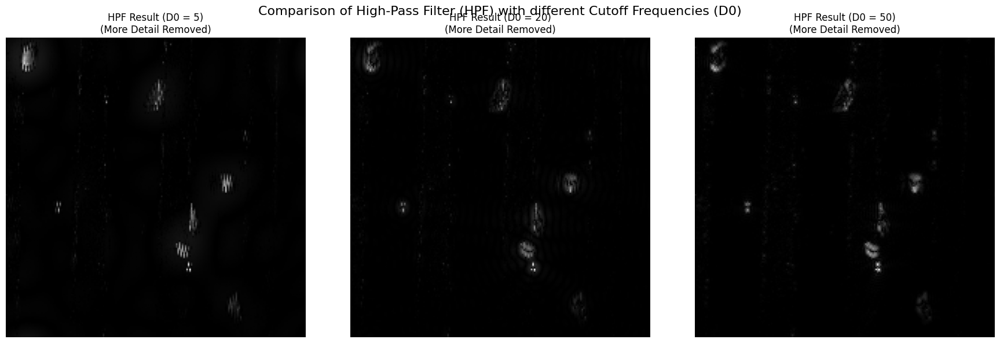

In [124]:
import matplotlib.pyplot as plt
import numpy as np

# --- ตรวจสอบตัวแปร (เผื่อยังไม่ได้รัน Cell ก่อนหน้า) ---
if 'vol' not in locals() or 'fft_vol' not in locals():
    print("⚠️ Warning: ไม่พบตัวแปร 'vol' หรือ 'fft_vol' กรุณารัน Cell โหลดไฟล์ .mat และ FFT ด้านบนก่อน")
else:
    # ฟังก์ชันสร้าง Mask (เหมือนเดิม)
    def create_ideal_mask(shape, filter_type, d0, w=None):
        rows, cols = shape
        crow, ccol = rows // 2, cols // 2
        y, x = np.ogrid[:rows, :cols]
        dist = np.sqrt((x - ccol)**2 + (y - crow)**2)
    
        # กำหนดค่า w (Width) เริ่มต้นถ้าไม่ได้ใส่มา
        if w is None: 
            w = 10

        if filter_type == 'HPF':
            # High-Pass: ตรงกลางดำ (0) รอบนอกขาว (1)
            mask = np.ones((rows, cols))
            mask[dist <= d0] = 0
        
        elif filter_type == 'BPF':
            # Band-Pass: วงแหวนขาว (1) พื้นหลังดำ (0)
            mask = np.zeros((rows, cols))
            mask[(dist >= d0 - w/2) & (dist <= d0 + w/2)] = 1
        
        elif filter_type == 'BSF':
            # Band-Stop: วงแหวนดำ (0) พื้นหลังขาว (1) <-- ส่วนที่ขาดไป
            mask = np.ones((rows, cols))
            mask[(dist >= d0 - w/2) & (dist <= d0 + w/2)] = 0
        
        else:
            # กรณีระบุชื่อผิด ให้คืนค่า Mask เปล่าๆ (ผ่านหมด) ป้องกัน Error
            mask = np.ones((rows, cols))
        
        return mask

    # --- ตั้งค่าการเปรียบเทียบ ---
    k = 30                     # เลือก Slice ที่ต้องการ
    D0_list = [5, 20, 50]      # *** ลองปรับค่าตรงนี้เพื่อเปรียบเทียบ ***
    
    img_original = vol[:, :, k]
    F_original = fft_vol[:, :, k]

    # สร้างกราฟแสดงผลแนวนอน 3 รูป
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))
    plt.suptitle(f"Comparison of High-Pass Filter (HPF) with different Cutoff Frequencies (D0)", fontsize=16)

    for i, d0 in enumerate(D0_list):
        # 1. สร้าง Mask และ Filter
        mask = create_ideal_mask(img_original.shape, 'HPF', d0)
        F_filtered = F_original * mask
        
        # 2. Inverse FFT
        img_back = np.abs(np.fft.ifft2(np.fft.ifftshift(F_filtered)))
        
        # 3. แสดงผล
        axes[i].imshow(img_back, cmap='gray', origin='lower')
        axes[i].set_title(f'HPF Result (D0 = {d0})\n(More Detail Removed)', fontsize=12)
        axes[i].axis('off')

    plt.tight_layout()
    plt.show()

In [125]:
import numpy as np
import matplotlib.pyplot as plt
from ipywidgets import interact, IntSlider

# 1. ฟังก์ชันสร้าง Mask (เหมือนเดิม)
def create_ideal_mask(shape, filter_type, d0, w=None):
    rows, cols = shape
    crow, ccol = rows // 2, cols // 2
    y, x = np.ogrid[:rows, :cols]
    dist = np.sqrt((x - ccol)**2 + (y - crow)**2)
    
    if w is None: w = 10

    if filter_type == 'HPF':
        mask = np.ones((rows, cols))
        mask[dist <= d0] = 0
    elif filter_type == 'BPF':
        mask = np.zeros((rows, cols))
        mask[(dist >= d0 - w/2) & (dist <= d0 + w/2)] = 1
    elif filter_type == 'BSF':
        mask = np.ones((rows, cols))
        mask[(dist >= d0 - w/2) & (dist <= d0 + w/2)] = 0
    else:
        mask = np.ones((rows, cols))
        
    return mask

# 2. ฟังก์ชัน Interactive (ปรับปรุงใหม่: เพิ่มรูปต้นฉบับทางซ้าย)
def interactive_filter_demo(slice_idx, d0, width, filter_type):
    if 'vol' not in globals() or 'fft_vol' not in globals():
        print("⚠️ Error: ไม่พบตัวแปร 'vol' หรือ 'fft_vol'")
        return

    # ดึงภาพและ Spectrum
    img = vol[:, :, slice_idx]
    F_orig = fft_vol[:, :, slice_idx]
    
    # สร้าง Mask
    if filter_type == 'High-Pass (HPF)':
        mask = create_ideal_mask(img.shape, 'HPF', d0)
        title_str = f"HPF (D0={d0})"
    elif filter_type == 'Band-Pass (BPF)':
        mask = create_ideal_mask(img.shape, 'BPF', d0, width)
        title_str = f"BPF (C={d0}, W={width})"
    elif filter_type == 'Band-Stop (BSF)':
        mask = create_ideal_mask(img.shape, 'BSF', d0, width)
        title_str = f"BSF (C={d0}, W={width})"
        
    # Apply Filter
    F_filtered = F_orig * mask
    img_back = np.abs(np.fft.ifft2(np.fft.ifftshift(F_filtered)))
    
    # --- ส่วนแสดงผล (ปรับเป็น 3 รูปเรียงกัน) ---
    fig, axes = plt.subplots(1, 3, figsize=(18, 6)) # ขยายขนาดรูปให้กว้างขึ้น
    
    # 1. ซ้ายสุด: ภาพต้นฉบับ (Original)
    axes[0].imshow(img, cmap='gray', origin='lower')
    axes[0].set_title(f"1. Original Image (Slice {slice_idx})")
    axes[0].axis('off')

    # 2. ตรงกลาง: หน้ากากความถี่ (Mask)
    axes[1].imshow(mask, cmap='gray', origin='lower')
    axes[1].set_title(f"2. Frequency Mask: {title_str}")
    axes[1].axis('off')
    
    # 3. ขวาสุด: ผลลัพธ์ (Result)
    axes[2].imshow(img_back, cmap='gist_heat', origin='lower')
    axes[2].set_title(f"3. Filtered Result")
    axes[2].axis('off')
    
    plt.tight_layout()
    plt.show()

# 3. เรียกใช้งาน
interact(interactive_filter_demo, 
         slice_idx=IntSlider(min=0, max=vol.shape[2]-1, step=1, value=30, description='Slice No.'),
         d0=IntSlider(min=1, max=100, step=1, value=20, description='D0 (Radius)'),
         width=IntSlider(min=1, max=50, step=1, value=10, description='Band Width'),
         filter_type=['High-Pass (HPF)', 'Band-Pass (BPF)', 'Band-Stop (BSF)']);

interactive(children=(IntSlider(value=30, description='Slice No.', max=60), IntSlider(value=20, description='D…

In [126]:
import numpy as np
import matplotlib.pyplot as plt
from ipywidgets import interact, IntSlider, FloatSlider, Dropdown

# ==========================================
# 1. ฟังก์ชันสร้าง Mask ครอบจักรวาล (All Filters)
# ==========================================
def create_filter_mask(shape, filter_type, mode, d0, order=2, width=20):
    """
    สร้าง Frequency Domain Filter Mask
    filter_type: 'Ideal', 'Butterworth', 'Gaussian'
    mode: 'Low Pass', 'High Pass', 'Band Pass', 'Band Stop'
    d0: Cutoff Frequency (หรือ Center Frequency สำหรับ Band filters)
    order: Order ของ Butterworth filter (n)
    width: Bandwidth สำหรับ Band filters (w)
    """
    rows, cols = shape
    crow, ccol = rows // 2, cols // 2
    y, x = np.ogrid[:rows, :cols]
    
    # คำนวณระยะห่างจากจุดศูนย์กลาง (Distance D(u,v))
    D = np.sqrt((x - ccol)**2 + (y - crow)**2)
    
    # ป้องกันการหารด้วยศูนย์ (สำหรับ Butterworth/Gaussian บางสูตร)
    D[D == 0] = 1e-5 

    # --- ส่วนคำนวณ H(u,v) พื้นฐาน (Low Pass) ---
    if filter_type == 'Ideal':
        # Ideal: ตัดฉับพลันที่ D0
        H = np.zeros_like(D)
        if mode in ['Low Pass', 'High Pass']:
            H[D <= d0] = 1.0
        else: # Band filters
            lower = d0 - width / 2
            upper = d0 + width / 2
            H[(D >= lower) & (D <= upper)] = 1.0

    elif filter_type == 'Butterworth':
        # Butterworth: 1 / (1 + (D/D0)^2n)
        if mode in ['Low Pass', 'High Pass']:
            H = 1 / (1 + (D / d0)**(2 * order))
        else: # Band filters
            # สูตร Band Reject (Stop) ของ Butterworth: 1 / (1 + [ (D*W) / (D^2 - D0^2) ]^2n )
            # เพื่อความง่าย เราจะคำนวณ Band Pass จาก 1 - Band Stop
            term = (D * width) / (D**2 - d0**2 + 1e-5) # +1e-5 กันหาร 0
            H = 1 / (1 + term**(2 * order))
            if mode == 'Band Pass':
                H = 1 - H # สลับ Band Stop เป็น Band Pass

    elif filter_type == 'Gaussian':
        # Gaussian: exp(-D^2 / 2D0^2)
        if mode in ['Low Pass', 'High Pass']:
            H = np.exp(-(D**2) / (2 * (d0**2)))
        else: # Band filters
            # Gaussian Band Pass: exp(- ((D^2 - D0^2) / (D*W))^2 )
            term = (D**2 - d0**2) / (D * width + 1e-5)
            H = np.exp(-(term**2))

    # --- แปลง H ตามโหมด (Low/High/Pass/Stop) ---
    if filter_type == 'Ideal':
        if mode == 'High Pass':
            H = 1 - H
        elif mode == 'Band Stop':
            H = 1 - H
            
    elif filter_type == 'Butterworth':
        if mode == 'High Pass':
            # สูตร HPF Butterworth: 1 / (1 + (D0/D)^2n) หรือแค่ 1 - LPF
            H = 1 / (1 + (d0 / D)**(2 * order))
        elif mode == 'Band Stop':
            # คำนวณไว้ข้างบนแล้วว่าเป็น Band Stop ตั้งแต่ต้น (สำหรับสูตรนี้)
             pass 

    elif filter_type == 'Gaussian':
        if mode == 'High Pass':
            H = 1 - H
        elif mode == 'Band Stop':
            H = 1 - H

    return H

# ==========================================
# 2. ฟังก์ชัน Interactive แสดงผล
# ==========================================
def interactive_all_filters(slice_idx, d0, width, order, filter_type, mode):
    # ตรวจสอบตัวแปร
    if 'vol' not in globals() or 'fft_vol' not in globals():
        print("⚠️ Error: ไม่พบข้อมูล 'vol' หรือ 'fft_vol'")
        return

    # 1. ดึงภาพและ FFT
    img = vol[:, :, slice_idx]
    F_orig = fft_vol[:, :, slice_idx]
    
    # 2. สร้าง Mask
    mask = create_filter_mask(img.shape, filter_type, mode, d0, order, width)
    
    # 3. Apply Filter
    F_filtered = F_orig * mask
    img_back = np.abs(np.fft.ifft2(np.fft.ifftshift(F_filtered)))
    
    # --- แสดงผล ---
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))
    
    # ภาพต้นฉบับ
    axes[0].imshow(img, cmap='gray', origin='lower')
    axes[0].set_title(f"Original (Slice {slice_idx})")
    axes[0].axis('off')
    
    # Mask (แสดงเป็นภาพ 2D)
    axes[1].imshow(mask, cmap='gray', origin='lower', vmin=0, vmax=1)
    axes[1].set_title(f"Mask: {filter_type} - {mode}\n(D0={d0}, n={order}, W={width})")
    axes[1].axis('off')
    
    # ผลลัพธ์
    axes[2].imshow(img_back, cmap='gist_heat', origin='lower')
    axes[2].set_title("Filtered Result")
    axes[2].axis('off')
    
    plt.tight_layout()
    plt.show()

# ==========================================
# 3. สร้างแผงควบคุม (Widgets)
# ==========================================
interact(interactive_all_filters, 
         slice_idx = IntSlider(min=0, max=60, step=1, value=30, description='Slice No.'),
         filter_type = Dropdown(options=['Ideal', 'Butterworth', 'Gaussian'], value='Ideal', description='Filter Type'),
         mode        = Dropdown(options=['Low Pass', 'High Pass', 'Band Pass', 'Band Stop'], value='Low Pass', description='Mode'),
         d0          = IntSlider(min=1, max=100, step=1, value=20, description='Cutoff/Center (D0)'),
         width       = IntSlider(min=1, max=50, step=1, value=10, description='Band Width (W)'),
         order       = IntSlider(min=1, max=10, step=1, value=2, description='Order (n) - BW only')
);

interactive(children=(IntSlider(value=30, description='Slice No.', max=60), IntSlider(value=20, description='C…

In [127]:
import numpy as np
import matplotlib.pyplot as plt
from ipywidgets import interact, IntSlider, Dropdown

# 1. ฟังก์ชันสร้าง Mask แบบแถบ (Bar/Rectangular) - เพิ่ม LPF
def create_bar_mask(shape, filter_type, d0, w=10, orientation='Both'):
    rows, cols = shape
    crow, ccol = rows // 2, cols // 2
    
    # สร้าง Grid เต็มแผ่น
    x = np.arange(cols)
    y = np.arange(rows)
    X, Y = np.meshgrid(x, y)
    
    # คำนวณระยะห่างจากแกนกลาง
    dist_x = np.abs(X - ccol) 
    dist_y = np.abs(Y - crow) 
    
    # --- 1. กำหนดพื้นหลัง Mask ---
    # LPF และ BPF เริ่มต้นด้วยดำ (0) แล้วเปิดช่องให้ผ่าน
    # HPF และ BSF เริ่มต้นด้วยขาว (1) แล้วปิดช่องทิ้ง
    if filter_type in ['BPF', 'LPF']: 
        mask = np.zeros((rows, cols))
    else:
        mask = np.ones((rows, cols))
        
    # --- 2. เลือกรูปทรงระยะห่าง (Distance) ---
    if orientation == 'Vertical':     # แถบตั้ง
        dist = dist_x
    elif orientation == 'Horizontal': # แถบนอน
        dist = dist_y
    else:                             # Both = สี่เหลี่ยม (Box)
        dist = np.maximum(dist_x, dist_y)

    # --- 3. สร้าง Filter ---
    if filter_type == 'LPF':
        # Low-Pass: ปล่อยตรงกลาง/แถบกลางผ่าน (1)
        mask[dist <= d0] = 1
        
    elif filter_type == 'HPF':
        # High-Pass: บล็อกตรงกลาง/แถบกลาง (0)
        mask[dist <= d0] = 0
        
    elif filter_type == 'BPF':
        # Band-Pass: ปล่อยเฉพาะช่วงแถบที่กำหนด (1)
        mask[(dist >= d0 - w/2) & (dist <= d0 + w/2)] = 1
        
    elif filter_type == 'BSF':
        # Band-Stop: ตัดเฉพาะช่วงแถบที่กำหนดทิ้ง (0)
        mask[(dist >= d0 - w/2) & (dist <= d0 + w/2)] = 0
        
    return mask

# 2. ฟังก์ชัน Interactive (เพิ่มตัวเลือก LPF)
def interactive_bar_filter(slice_idx, d0, width, filter_type, orientation):
    # ตรวจสอบตัวแปร
    if 'vol' not in globals() or 'fft_vol' not in globals():
        print("⚠️ Error: ไม่พบข้อมูล 'vol' หรือ 'fft_vol' กรุณารัน Cell โหลดข้อมูลด้านบนก่อน")
        return

    img = vol[:, :, slice_idx]
    F_orig = fft_vol[:, :, slice_idx]
    
    # สร้าง Mask
    mask = create_bar_mask(img.shape, filter_type, d0, width, orientation)
    
    # Apply Filter
    F_filtered = F_orig * mask
    img_back = np.abs(np.fft.ifft2(np.fft.ifftshift(F_filtered)))
    
    # แสดงผล
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))
    
    axes[0].imshow(img, cmap='gray', origin='lower')
    axes[0].set_title(f"Original (Slice {slice_idx})")
    axes[0].axis('off')
    
    axes[1].imshow(mask, cmap='gray', origin='lower', vmin=0, vmax=1)
    axes[1].set_title(f"Mask: {filter_type} ({orientation})\nD0={d0}, W={width}")
    axes[1].axis('off')
    
    axes[2].imshow(img_back, cmap='gist_heat', origin='lower')
    axes[2].set_title("Result")
    axes[2].axis('off')
    
    plt.show()

# 3. เรียกใช้งาน (เพิ่ม LPF ใน Dropdown)
interact(interactive_bar_filter, 
         slice_idx = IntSlider(min=0, max=60, step=1, value=30, description='Slice No.'),
         filter_type = Dropdown(options=['LPF', 'HPF', 'BPF', 'BSF'], value='LPF', description='Type'),
         orientation = Dropdown(options=['Both', 'Vertical', 'Horizontal'], value='Both', description='Shape'),
         d0          = IntSlider(min=1, max=100, step=1, value=20, description='Position (D0)'),
         width       = IntSlider(min=1, max=50, step=1, value=10, description='Width (W)')
);

interactive(children=(IntSlider(value=30, description='Slice No.', max=60), IntSlider(value=20, description='P…

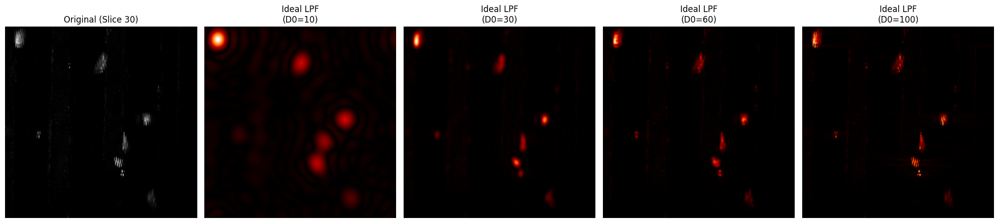

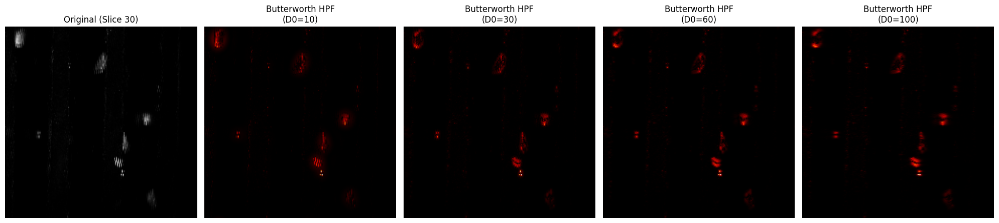

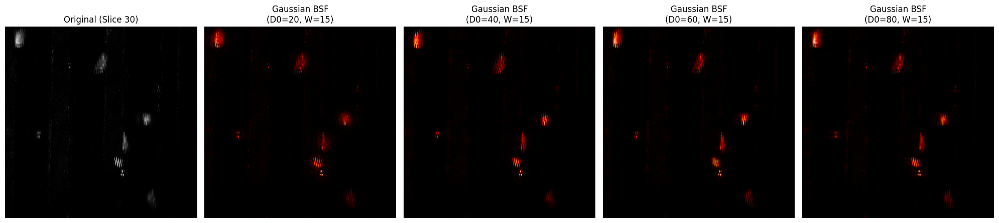

In [128]:
import numpy as np
import matplotlib.pyplot as plt

# ==========================================
# 1. ฟังก์ชันสร้าง Mask (รวมทุก Filter & Mode)
# ==========================================
def create_filter_mask(shape, filter_type, mode, d0, order=2, width=20):
    rows, cols = shape
    crow, ccol = rows // 2, cols // 2
    y, x = np.ogrid[:rows, :cols]
    
    # คำนวณระยะห่าง D(u,v)
    D = np.sqrt((x - ccol)**2 + (y - crow)**2)
    D[D == 0] = 1e-5 # กันหาร 0

    # --- คำนวณ H(u,v) พื้นฐาน (Low Pass) ---
    if filter_type == 'Ideal':
        H = np.zeros_like(D)
        if mode in ['LPF', 'HPF']:
            H[D <= d0] = 1.0
        else: # Band Pass/Stop
            lower = d0 - width / 2
            upper = d0 + width / 2
            H[(D >= lower) & (D <= upper)] = 1.0

    elif filter_type == 'Butterworth':
        if mode in ['LPF', 'HPF']:
            H = 1 / (1 + (D / d0)**(2 * order))
        else: # Band filters
            term = (D * width) / (D**2 - d0**2 + 1e-5)
            H = 1 / (1 + term**(2 * order))
            if mode == 'BPF': H = 1 - H 

    elif filter_type == 'Gaussian':
        if mode in ['LPF', 'HPF']:
            H = np.exp(-(D**2) / (2 * (d0**2)))
        else: # Band filters
            term = (D**2 - d0**2) / (D * width + 1e-5)
            H = np.exp(-(term**2))

    # --- สลับโหมด (Invert Mask) ---
    if mode in ['HPF', 'BSF']:
        H = 1 - H

    return H

# ==========================================
# 2. ฟังก์ชันแสดงผลเปรียบเทียบ (Compare Side-by-Side)
# ==========================================
def show_comparison(slice_idx, filter_type, mode, d0_list, width=20, order=2):
    """
    แสดงภาพเปรียบเทียบค่า D0 จากน้อยไปมาก
    """
    # ตรวจสอบตัวแปร
    if 'vol' not in globals() or 'fft_vol' not in globals():
        print("⚠️ Error: ไม่พบข้อมูล 'vol' หรือ 'fft_vol'")
        return

    img = vol[:, :, slice_idx]
    F_orig = fft_vol[:, :, slice_idx]
    
    # สร้าง subplots: จำนวนรูป = 1 (ต้นฉบับ) + จำนวนค่าใน d0_list
    n_plots = 1 + len(d0_list)
    fig, axes = plt.subplots(1, n_plots, figsize=(4 * n_plots, 5))
    
    # รูปที่ 1: ต้นฉบับ
    axes[0].imshow(img, cmap='gray', origin='lower')
    axes[0].set_title(f"Original (Slice {slice_idx})")
    axes[0].axis('off')
    
    # รูปที่ 2 ถึง n: ผลลัพธ์ตามค่า D0
    for i, d0 in enumerate(d0_list):
        # สร้าง Mask & Filter
        mask = create_filter_mask(img.shape, filter_type, mode, d0, order, width)
        F_filtered = F_orig * mask
        img_back = np.abs(np.fft.ifft2(np.fft.ifftshift(F_filtered)))
        
        # แสดงผล
        ax = axes[i + 1]
        ax.imshow(img_back, cmap='gist_heat', origin='lower') # ใช้ cmap='gray' ได้ถ้าชอบขาวดำ
        
        # ตั้งชื่อรูปตามพารามิเตอร์
        if mode in ['BPF', 'BSF']:
            param_str = f"D0={d0}, W={width}"
        else:
            param_str = f"D0={d0}"
            
        ax.set_title(f"{filter_type} {mode}\n({param_str})")
        ax.axis('off')

    plt.tight_layout()
    plt.show()

# ==========================================
# 3. ตัวอย่างการเรียกใช้งาน (ปรับค่าตรงนี้ได้เลย)
# ==========================================

# ตัวอย่างที่ 1: Low Pass (ทำให้ภาพเบลอขึ้นเรื่อยๆ เมื่อ D0 น้อยลง)
# D0 น้อย = เบลอมาก, D0 มาก = เบลอน้อย (เก็บรายละเอียดได้เยอะขึ้น)
show_comparison(slice_idx=30, 
                filter_type='Ideal', 
                mode='LPF', 
                d0_list=[10, 30, 60, 100])

# ตัวอย่างที่ 2: High Pass (เห็นขอบชัดขึ้นเรื่อยๆ)
# D0 น้อย = เห็นภาพรวม, D0 มาก = เหลือแต่ขอบคมๆ
show_comparison(slice_idx=30, 
                filter_type='Butterworth', 
                mode='HPF', 
                d0_list=[10, 30, 60, 100], 
                order=2)

# ตัวอย่างที่ 3: Band Stop (ตัดความถี่เฉพาะช่วง)
show_comparison(slice_idx=30, 
                filter_type='Gaussian', 
                mode='BSF', 
                d0_list=[20, 40, 60, 80], 
                width=15)

1. Low Pass Filter (ตัดความถี่สูง -> ภาพเบลอ)


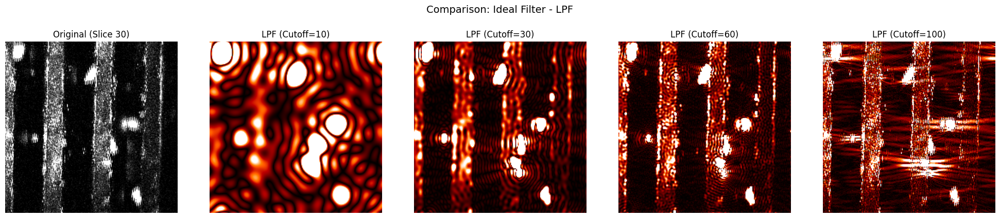


2. High Pass Filter (ตัดความถี่ต่ำ -> เหลือแต่ขอบ)


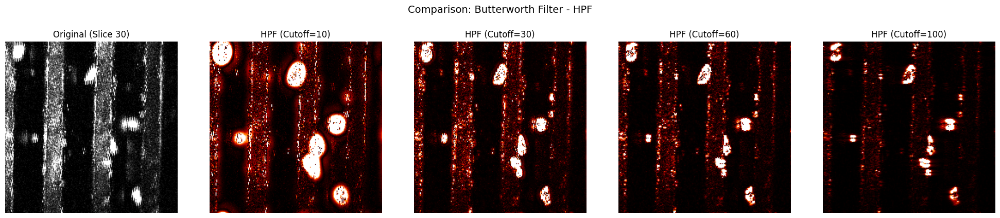


3. Band Pass Filter (เลือกเฉพาะช่วงความถี่)


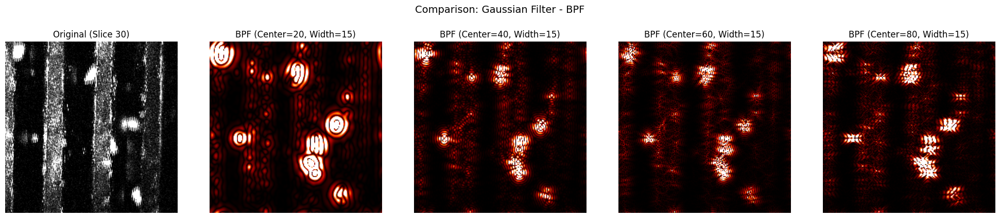


4. Band Stop Filter (ตัดช่วงความถี่ทิ้ง)


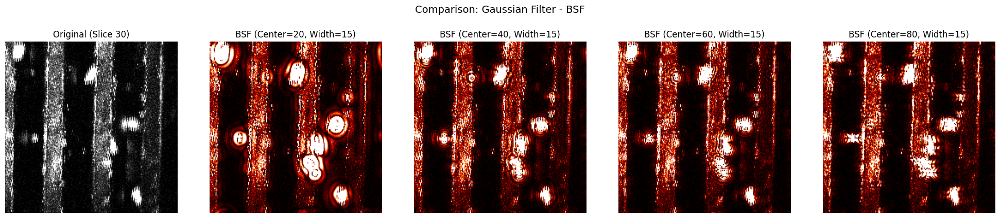

In [129]:
import numpy as np
import matplotlib.pyplot as plt

# ==========================================
# 1. ฟังก์ชันสร้าง Mask (รวมทุก Filter & Mode)
# ==========================================
def create_filter_mask(shape, filter_type, mode, d0, order=2, width=20):
    rows, cols = shape
    crow, ccol = rows // 2, cols // 2
    y, x = np.ogrid[:rows, :cols]
    
    # คำนวณระยะห่าง D(u,v)
    D = np.sqrt((x - ccol)**2 + (y - crow)**2)
    D[D == 0] = 1e-5 # กันหาร 0

    # --- คำนวณ H(u,v) ---
    if filter_type == 'Ideal':
        H = np.zeros_like(D)
        if mode in ['LPF', 'HPF']:
            H[D <= d0] = 1.0
        else: # Band Pass/Stop
            lower = d0 - width / 2
            upper = d0 + width / 2
            H[(D >= lower) & (D <= upper)] = 1.0

    elif filter_type == 'Butterworth':
        if mode in ['LPF', 'HPF']:
            H = 1 / (1 + (D / d0)**(2 * order))
        else: # Band filters
            term = (D * width) / (D**2 - d0**2 + 1e-5)
            H = 1 / (1 + term**(2 * order))
            if mode == 'BPF': H = 1 - H 

    elif filter_type == 'Gaussian':
        if mode in ['LPF', 'HPF']:
            H = np.exp(-(D**2) / (2 * (d0**2)))
        else: # Band filters
            # Gaussian Band Pass สูตร: exp(- ((D^2 - D0^2) / (D*W))^2 )
            term = (D**2 - d0**2) / (D * width + 1e-5)
            H = np.exp(-(term**2))

    # --- สลับโหมด (Invert Mask) ---
    # HPF และ BSF คือส่วนกลับของ LPF และ BPF
    if mode in ['HPF', 'BSF']:
        H = 1 - H

    return H

# ==========================================
# 2. ฟังก์ชันแสดงผลเปรียบเทียบ
# ==========================================
def show_comparison(slice_idx, filter_type, mode, d0_list, width=20, order=2):
    
    # ตรวจสอบตัวแปร
    if 'vol' not in globals() or 'fft_vol' not in globals():
        print("⚠️ Error: ไม่พบข้อมูล 'vol' หรือ 'fft_vol'")
        return

    img = vol[:, :, slice_idx]
    F_orig = fft_vol[:, :, slice_idx]
    
    # คำนวณ vmin/vmax อัตโนมัติ
    vmin = np.percentile(img, 2)
    vmax = np.percentile(img, 95)
    
    # สร้าง subplots
    n_plots = 1 + len(d0_list)
    fig, axes = plt.subplots(1, n_plots, figsize=(4 * n_plots, 4))
    
    # รูปที่ 1: ต้นฉบับ
    axes[0].imshow(img, cmap='gray', origin='lower', vmin=vmin, vmax=vmax)
    axes[0].set_title(f"Original (Slice {slice_idx})")
    axes[0].axis('off')
    
    # รูปเปรียบเทียบ
    for i, d0 in enumerate(d0_list):
        # สร้าง Mask & Filter
        mask = create_filter_mask(img.shape, filter_type, mode, d0, order, width)
        F_filtered = F_orig * mask
        img_back = np.abs(np.fft.ifft2(np.fft.ifftshift(F_filtered)))
        
        # แสดงผล
        ax = axes[i + 1]
        ax.imshow(img_back, cmap='gist_heat', origin='lower', vmin=vmin, vmax=vmax)
        
        # ตั้งชื่อรูป
        if mode in ['BPF', 'BSF']:
            info = f"Center={d0}, Width={width}"
        else:
            info = f"Cutoff={d0}"
            
        ax.set_title(f"{mode} ({info})")
        ax.axis('off')

    plt.suptitle(f"Comparison: {filter_type} Filter - {mode}", fontsize=14, y=1.05)
    plt.tight_layout()
    plt.show()

# ==========================================
# 3. รันเปรียบเทียบครบทั้ง 4 แบบ (LPF, HPF, BPF, BSF)
# ==========================================

# เลือก Slice ที่ต้องการดู
k = 30 

# 1. Low Pass Filter (ทำให้ภาพนวล/เบลอ)
print("1. Low Pass Filter (ตัดความถี่สูง -> ภาพเบลอ)")
show_comparison(k, 'Ideal', 'LPF', d0_list=[10, 30, 60, 100])

# 2. High Pass Filter (เน้นขอบ)
print("\n2. High Pass Filter (ตัดความถี่ต่ำ -> เหลือแต่ขอบ)")
show_comparison(k, 'Butterworth', 'HPF', d0_list=[10, 30, 60, 100], order=2)

# 3. Band Pass Filter (เลือกเฉพาะย่านความถี่กลางๆ)
# จะเห็นลักษณะโครงสร้างภาพที่เปลี่ยนไปตามย่านความถี่ที่เลือก
print("\n3. Band Pass Filter (เลือกเฉพาะช่วงความถี่)")
show_comparison(k, 'Gaussian', 'BPF', d0_list=[20, 40, 60, 80], width=15)

# 4. Band Stop Filter (ตัดย่านความถี่กลางๆ ทิ้ง)
# มักใช้ลบ Noise ที่เป็นลายแพทเทิร์น โดยยังคงรายละเอียดส่วนใหญ่ไว้
print("\n4. Band Stop Filter (ตัดช่วงความถี่ทิ้ง)")
show_comparison(k, 'Gaussian', 'BSF', d0_list=[20, 40, 60, 80], width=15)